<center style="border-radius:10px;
padding: 3rem 2rem;
border: 3px solid #FA8237;
">
<h1 style="color:#FA8237; 
font-size:3.0rem;
margin:0;
">Monocular Depth Estimation</h1>
<h2 style="color:#FA8237; 
font-size:2.0rem;
margin-top:1rem;
margin-bottom:2.5rem;
">NYU Depth v2 dataset</h2>
<a href="https://kaggle.com/shreydan" style="color: white;
background-color: #FA8237;
border-radius: 25px;
padding: 1rem 1.5rem;
text-decoration: none;
">@shreydan</a>
</center>

# Imports
<div style="width:100%;height:0;border-bottom: 3px solid #F59A31;margin-bottom: 1rem;"></div>


In [1]:
!pip install -Uq segmentation-models-pytorch

DEPRECATION: seg-torch 0.1.7 has a non-standard dependency specifier tensorboardX>=2.0opencv-python. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of seg-torch or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [2]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.cuda.amp import GradScaler, autocast
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from pathlib import Path
import cv2 as cv
from PIL import Image
import segmentation_models_pytorch as smp
from sklearn.model_selection import train_test_split
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchmetrics.image import StructuralSimilarityIndexMeasure as SSIM
from torchmetrics.regression import MeanSquaredError as MSE
from torchmetrics.collections import MetricCollection
import gc
from torchvision.transforms import Normalize

/home/multimediateam/miniconda3/envs/depth/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Data & Visualization
### Note: brighter the area, farther it is in the image, brighter => more depth
<div style="width:100%;height:0;border-bottom: 3px solid #F7D735;margin-bottom: 1rem;"></div>


In [4]:
train_csv = Path('nyu_data/data/nyu2_train.csv')
train_ims_path = Path('nyu_data/data/nyu2_train')
base_path = Path('nyu_data')

In [5]:
df = pd.read_csv(train_csv,header=None)
df[0] = df[0].map(lambda x:base_path/x)
df[1] = df[1].map(lambda x:base_path/x)
df.head()

,0,1
0,nyu_data/data/nyu2_train/living_room_0038_out/...,nyu_data/data/nyu2_train/living_room_0038_out/...
1,nyu_data/data/nyu2_train/living_room_0038_out/...,nyu_data/data/nyu2_train/living_room_0038_out/...
2,nyu_data/data/nyu2_train/living_room_0038_out/...,nyu_data/data/nyu2_train/living_room_0038_out/...
3,nyu_data/data/nyu2_train/living_room_0038_out/...,nyu_data/data/nyu2_train/living_room_0038_out/...
4,nyu_data/data/nyu2_train/living_room_0038_out/...,nyu_data/data/nyu2_train/living_room_0038_out/...


In [6]:
train_df, val_df = train_test_split(df,test_size=0.1,shuffle=True)
val_df, test_df = train_test_split(val_df, test_size=0.1,shuffle=True)
train_df.reset_index(drop=True,inplace=True)
val_df.reset_index(drop=True,inplace=True)
test_df.reset_index(drop=True,inplace=True)
len(train_df),len(val_df), len(test_df)

(45619, 4562, 507)

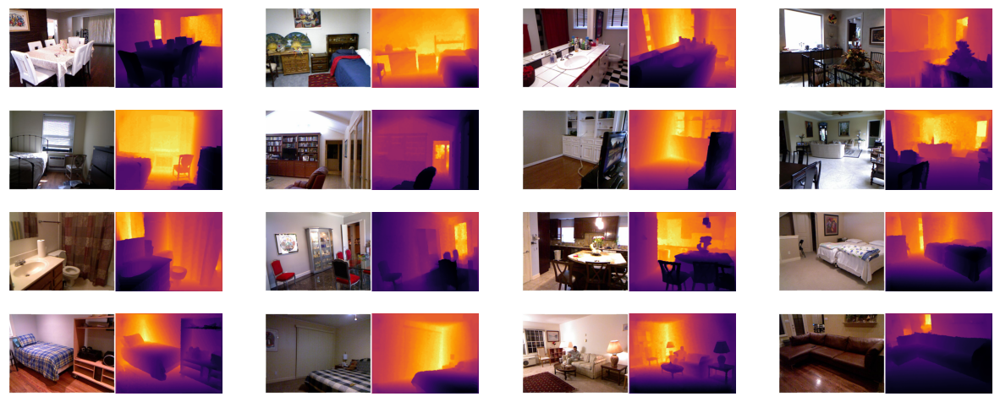

In [7]:
def colored_depthmap(depth, d_min=None, d_max=None,cmap=plt.cm.inferno):
    if d_min is None:
        d_min = np.min(depth)
    if d_max is None:
        d_max = np.max(depth)
    depth_relative = (depth - d_min) / (d_max - d_min)
    return 255 * cmap(depth_relative)[:,:,:3] # H, W, C

def merge_into_row(input, depth_target):
    input = np.array(input)
    depth_target = np.squeeze(np.array(depth_target))

    d_min = np.min(depth_target)
    d_max = np.max(depth_target)
    depth_target_col = colored_depthmap(depth_target, d_min, d_max)
    img_merge = np.hstack([input, depth_target_col])
    
    return img_merge

plt.figure(figsize=(15, 6))
for i, idx in enumerate(np.random.randint(0,len(df),(16,))):
    ax = plt.subplot(4, 4, i + 1)
    image = Image.open(df.iloc[idx,0]).convert('RGB')
    mask = Image.open(df.iloc[idx,1]).convert('L')
    image_viz = merge_into_row(
        image,mask
    )
    plt.imshow(image_viz.astype("uint8"))
    plt.axis("off")

# Dataset
<div style="width:100%;height:0;border-bottom: 3px solid #F7F437;margin-bottom: 1rem;"></div>


In [8]:
sample_tfms = [
    A.HorizontalFlip(),
    A.GaussNoise(p=0.2),
    A.OneOf([
        A.MotionBlur(p=.3),
        A.MedianBlur(blur_limit=3, p=0.3),
        A.Blur(blur_limit=3, p=0.5),
    ], p=0.3),
    A.RGBShift(),
    A.RandomBrightnessContrast(),
    A.RandomResizedCrop(384,384),
    A.ColorJitter(),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.3, rotate_limit=45, p=0.5),
    A.HueSaturationValue(p=0.3),
]
train_tfms = A.Compose([
    *sample_tfms,
    A.Resize(224,224),
    A.Normalize(always_apply=True),
    ToTensorV2()
])
valid_tfms = A.Compose([
    A.Resize(224,224),
    A.Normalize(always_apply=True),
    ToTensorV2()
])

In [9]:
class Dataset:
    def __init__(self,df,tfms):
        self.df = df
        self.tfms=tfms
    def open_im(self,p,gray=False):
        im = cv.imread(str(p))
        im = cv.cvtColor(im,cv.COLOR_BGR2GRAY if gray else cv.COLOR_BGR2RGB)
        return im
    
    def __len__(self,):
        return len(self.df)
    
    def __getitem__(self,idx):
        s = self.df.iloc[idx,:]
        im, dp = s[0],s[1]
        im, dp = self.open_im(im), self.open_im(dp,True)
        augs = self.tfms(image=im,mask=dp)
        im, dp = augs['image'], augs['mask'] / 255.
        return im, dp.unsqueeze(0)

In [10]:
train_ds = Dataset(train_df,train_tfms)
val_ds = Dataset(val_df,valid_tfms)
test_ds = Dataset(test_df, valid_tfms)
len(train_ds), len(val_ds), len(test_ds)

(45619, 4562, 507)

# Transforms Visualization
<div style="width:100%;height:0;border-bottom: 3px solid #DEF839;margin-bottom: 1rem;"></div>

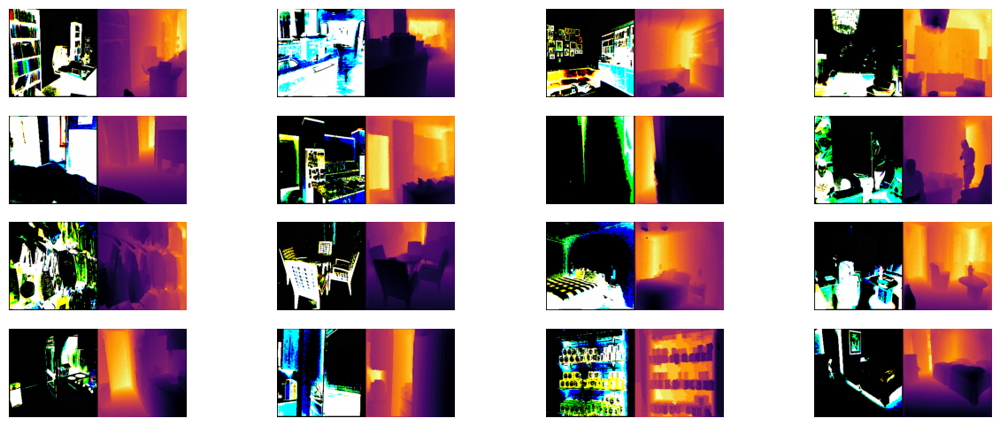

In [11]:
randoms = [test_ds[idx] for idx in range(16)]
plt.figure(figsize=(15, 6))
for i, (img,mask) in enumerate(randoms):
    ax = plt.subplot(4, 4, i + 1)
    img, mask = img.permute(1,2,0).numpy(), mask.permute(1,2,0).numpy()
    mask = colored_depthmap(np.squeeze(mask))
    image_viz = np.hstack([img,mask])
    plt.imshow(image_viz.astype("uint8"))
    plt.axis("off")

In [15]:
train_dl = torch.utils.data.DataLoader(train_ds,shuffle=True,batch_size=64)
val_dl = torch.utils.data.DataLoader(val_ds,shuffle=False,batch_size=64)
test_dl = torch.utils.data.DataLoader(test_ds, shuffle=True, batch_size=4)
len(train_dl), len(val_dl), len(test_dl)

(713, 72, 127)

# Model
<div style="width:100%;height:0;border-bottom: 3px solid #C3F93B;margin-bottom: 1rem;"></div>

In [12]:
class UNet(nn.Module):
    def __init__(self,):
        super().__init__()
        self.model = smp.UnetPlusPlus(
            encoder_name='resnext50_32x4d',
            in_channels=3,
            classes=1
        )
        
    def trainable_encoder(self,trainable=True):
        for p in self.model.encoder.parameters():
            p.requires_grad = trainable
        
    def forward(self,x):
        return self.model(x)
    
    def _num_params(self,):
        return sum([p.numel() for p in self.model.parameters() if p.requires_grad])

# Training
<div style="width:100%;height:0;border-bottom: 3px solid #F59A31;margin-bottom: 1rem;"></div>

### Metrics:

####  Structural Similarity Index (SSIM)

The structural similarity index (SSIM) is a perceptual metric that takes into account the structural similarity of the two images. SSIM is calculated by comparing the local patterns of the two images, taking into account the luminance, contrast, and structure of the images.

The formula for SSIM is:

$$ SSIM = \frac{(2 \mu_x \mu_y + c_1) (2 \sigma_{xy} + c_2)}{(\mu_x^2 + \mu_y^2 + c_1) (\sigma_x^2 + \sigma_y^2 + c_2)} $$

where μx​ and μy​ are the means of the two images, σx2​ and σy2​ are the variances of the two images, and σxy​ is the covariance of the two images. c1​ and c2​ are constants that are used to stabilize the calculation of SSIM.

SSIM is more robust to noise and small changes than MSE, but it is also more computationally expensive to calculate.

In general, SSIM is preferred over MSE for image quality assessment because it provides a more accurate measure of how humans perceive the similarity of two images. However, MSE is still a useful metric, especially when speed is important.

In [16]:
class UnNormalize(Normalize):
    def __init__(self,*args,**kwargs):
        mean=(0.485, 0.456, 0.406)
        std=(0.229, 0.224, 0.225)
        new_mean = [-m/s for m,s in zip(mean,std)]
        new_std = [1/s for s in std]
        super().__init__(new_mean, new_std, *args, **kwargs)

@torch.no_grad()
def plot_vals(imgs, preds, targets,n=4,figsize=(6,2),title=''):
    plt.figure(figsize=figsize,dpi=150)
    r = 2 if n == 4 else 8
    c = 2
    for i,idx in enumerate(np.random.randint(0,imgs.size(0),(n,))):
        ax = plt.subplot(r,c,i + 1)
        img,pred,gt = imgs[idx], preds[idx], targets[idx]
        img = UnNormalize()(img)*255.
        img,pred,gt = img.permute(1,2,0).numpy(), pred.permute(1,2,0).numpy(), gt.permute(1,2,0).numpy()
        pred = colored_depthmap(np.squeeze(pred))
        gt = colored_depthmap(np.squeeze(gt))
        image_viz = np.hstack([img,pred,gt])
        plt.imshow(image_viz.astype("uint8"))
        plt.axis("off")
    title = f'{title}\nimage/target/prediction' if len(title)!=0 else 'image/target/prediction'
    plt.suptitle(title)
    plt.show()

In [27]:
from Depth_net import Depth
from Resnet_depth import ResNet
from critera import berHuLoss
epochs = 40
freeze_epochs = 2
lr = 1e-3

device = 'cuda'

metrics = MetricCollection([
    SSIM(data_range=(0,1)),
    MSE()
]).to(device)
train_metrics = metrics.clone()
val_metrics = metrics.clone()

logs = pd.DataFrame()
logs[['loss_train','loss_val','ssim_train','ssim_val','mse_train','mse_val']]=None

model = ResNet(layers=18,decoder="upproj",output_size=(224,224)).to(device)

loss_fn = berHuLoss()
optim = torch.optim.AdamW(model.parameters(),lr=lr / 25.,weight_decay=0.02)
sched = torch.optim.lr_scheduler.OneCycleLR(optim,max_lr=lr,epochs=epochs,steps_per_epoch=(len(train_dl)))

scaler = GradScaler()

/home/multimediateam/miniconda3/envs/depth/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/multimediateam/miniconda3/envs/depth/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


training decoder only


  0%|          | 0/40 [00:00<?, ?it/s]/home/multimediateam/miniconda3/envs/depth/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:138: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "
loss: 0.090: 100%|██████████| 72/72 [00:22<00:00,  3.27it/s]




  loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
0   0.394418  0.119254   0.431908  0.388884  0.391218  0.037009




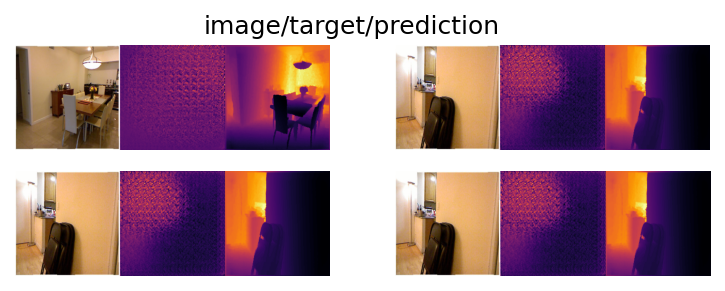

loss: 0.057: 100%|██████████| 72/72 [00:21<00:00,  3.28it/s]




  loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
1     0.0793  0.076924   0.721112  0.693649  0.012891  0.016682




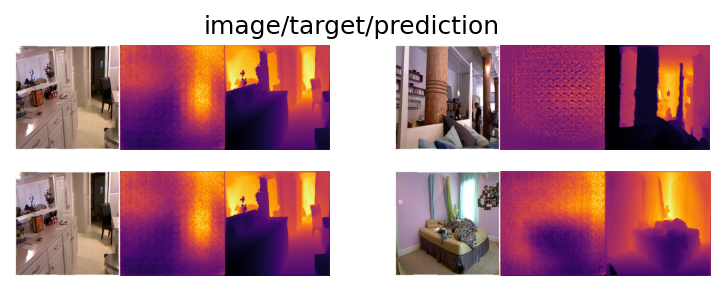

loss: 0.039: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




  loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
2   0.068921  0.052447   0.796017  0.838077  0.010126  0.006497




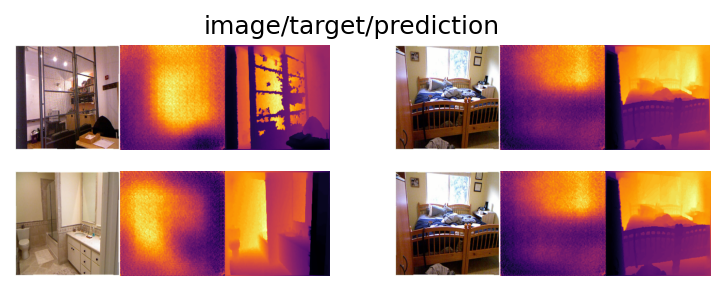

loss: 0.036: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




  loss_train loss_val ssim_train  ssim_val mse_train   mse_val
3   0.066518  0.05771   0.832082  0.844852  0.010063  0.008108




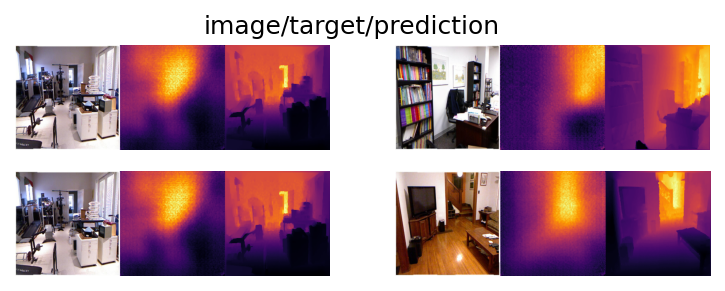

loss: 0.049: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




  loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
4   0.064096  0.064867   0.855968  0.825103   0.00935  0.015936




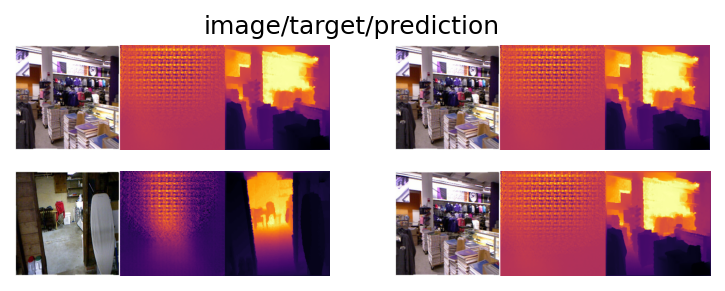

loss: 0.098: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




  loss_train loss_val ssim_train  ssim_val mse_train   mse_val
5   0.063785  0.07529   0.870003  0.856492  0.009458  0.022412




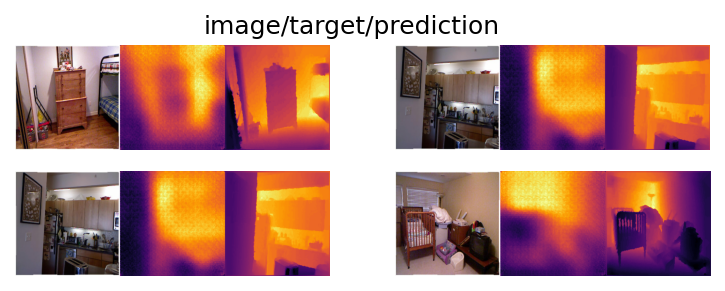

loss: 0.032: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




  loss_train  loss_val ssim_train ssim_val mse_train   mse_val
6    0.06243  0.062429   0.880398  0.89094  0.009183  0.019649




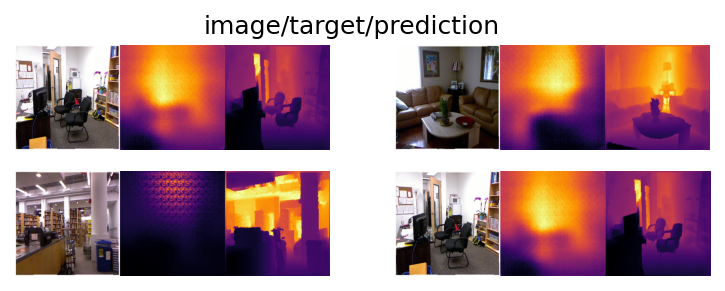

loss: 0.034: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




  loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
7   0.064263  0.044874   0.875891  0.894926  0.009442  0.004581




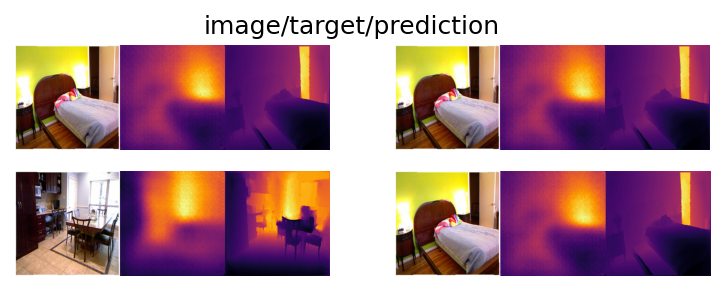

loss: 0.060: 100%|██████████| 72/72 [00:22<00:00,  3.23it/s]




  loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
8   0.060379  0.046835   0.888639  0.897412  0.008221  0.007554




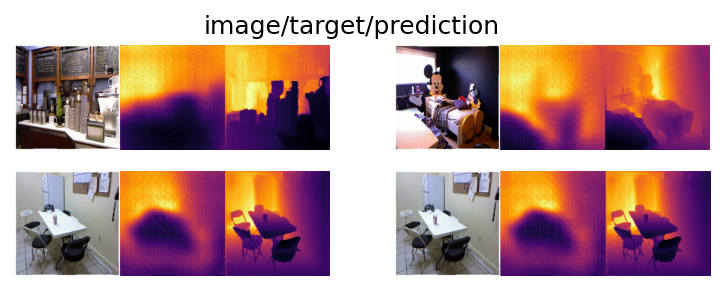

loss: 0.036: 100%|██████████| 72/72 [00:22<00:00,  3.24it/s]




  loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
9   0.059558  0.041811    0.89369  0.904314   0.00815  0.004147




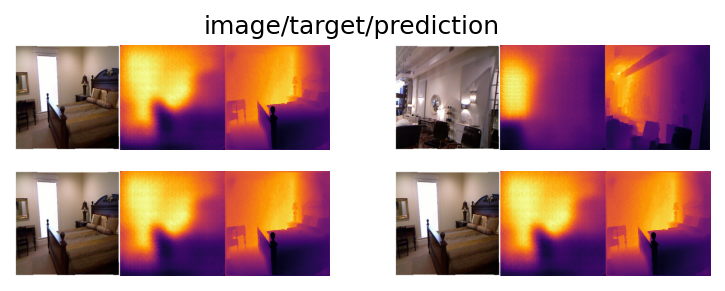

loss: 0.046: 100%|██████████| 72/72 [00:22<00:00,  3.22it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
10    0.05979  0.050915   0.896825  0.895653  0.008222  0.006628




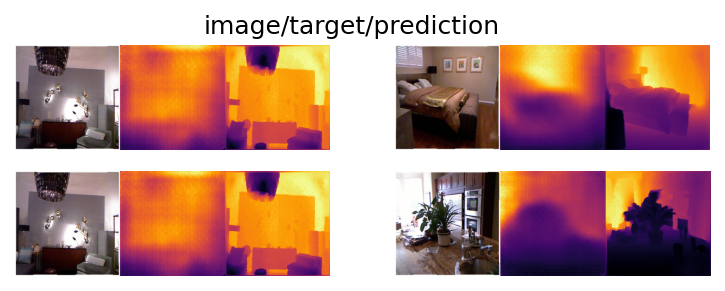

loss: 0.030: 100%|██████████| 72/72 [00:22<00:00,  3.23it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train  mse_val
11   0.057976  0.039138   0.899927  0.908169  0.007738  0.00391




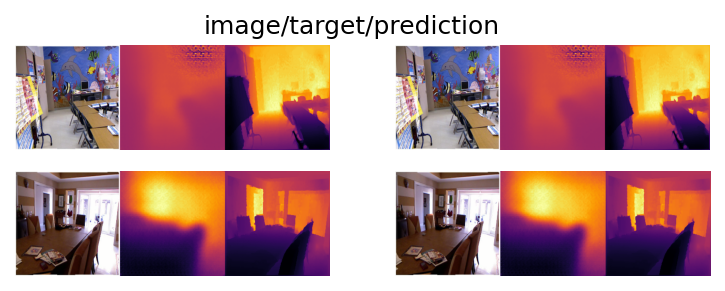

loss: 0.030: 100%|██████████| 72/72 [00:21<00:00,  3.28it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
12   0.053799  0.043034   0.905798  0.907261  0.006645  0.005426




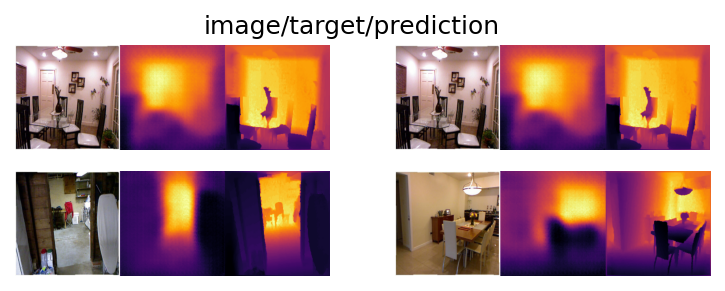

loss: 0.029: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
13   0.053925  0.038492   0.904148  0.906427  0.006684  0.004304




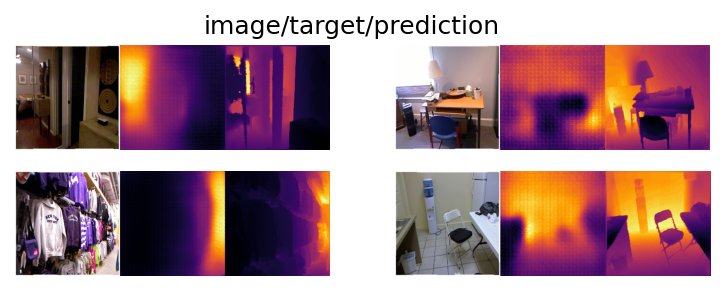

loss: 0.032: 100%|██████████| 72/72 [00:22<00:00,  3.22it/s]




   loss_train  loss_val ssim_train ssim_val mse_train   mse_val
14   0.052568  0.038062   0.905607  0.91011  0.006346  0.003642




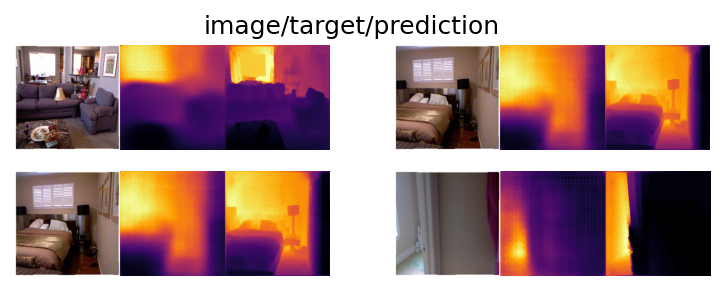

loss: 0.029: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
15   0.049815  0.036198   0.911619  0.914341  0.005645  0.003348




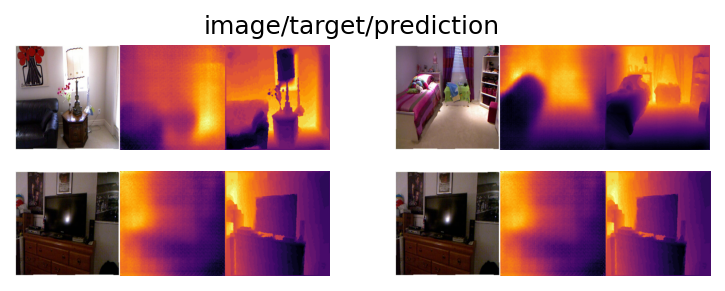

loss: 0.032: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
16   0.048613  0.035949   0.913426  0.914258  0.005455  0.003748




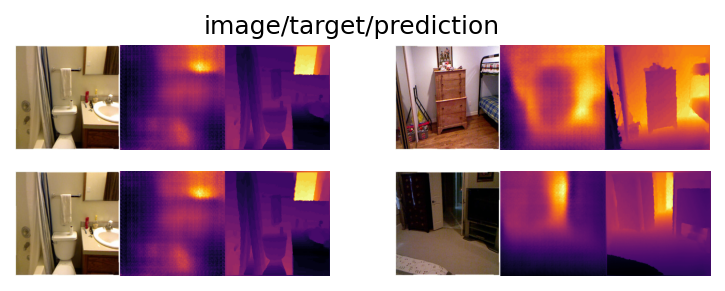

loss: 0.028: 100%|██████████| 72/72 [00:22<00:00,  3.24it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
17   0.047699  0.033114   0.913825  0.915953  0.005286  0.002894




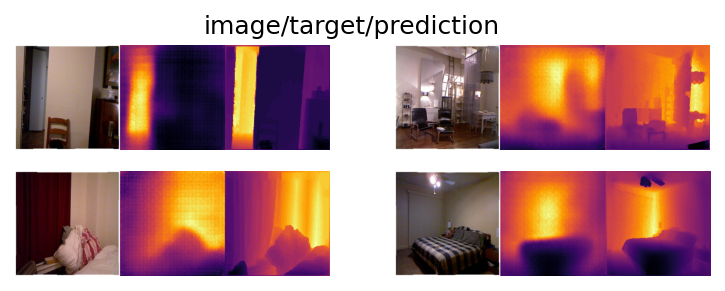

loss: 0.037: 100%|██████████| 72/72 [00:22<00:00,  3.23it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
18   0.045933  0.048425    0.91555  0.896544  0.004931  0.006128




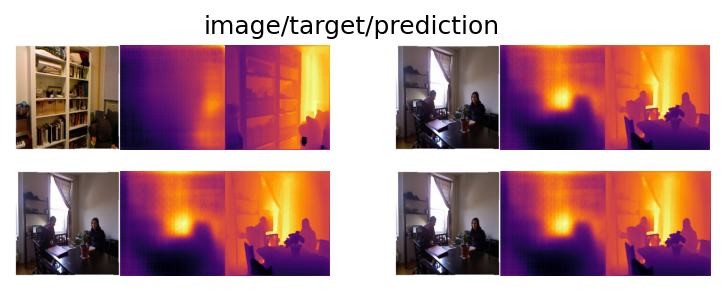

loss: 0.026: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




   loss_train loss_val ssim_train  ssim_val mse_train   mse_val
19   0.045556  0.03149   0.916714  0.919032  0.004861  0.002615




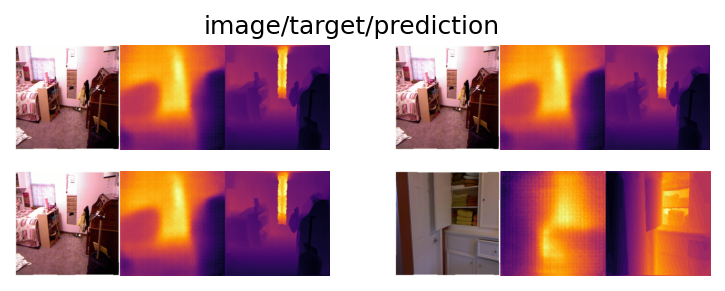

loss: 0.028: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




   loss_train  loss_val ssim_train ssim_val mse_train   mse_val
20   0.043467  0.032572   0.919364  0.91757  0.004501  0.002679




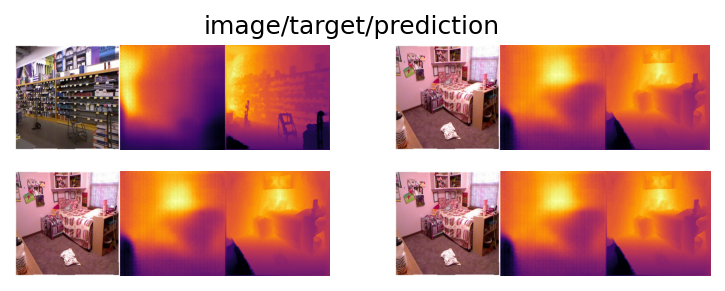

loss: 0.026: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
21   0.042598  0.030802   0.920525  0.916846  0.004316  0.002473




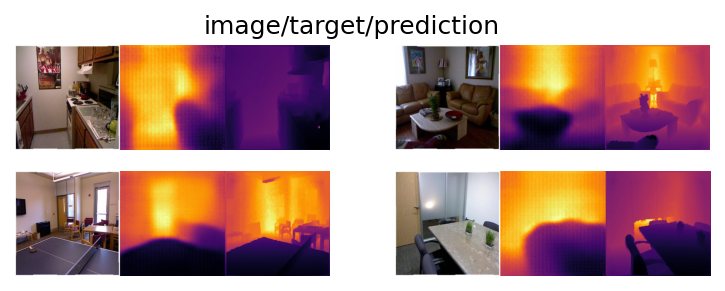

loss: 0.024: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
22   0.041303  0.029893   0.922264  0.920967  0.004103  0.002376




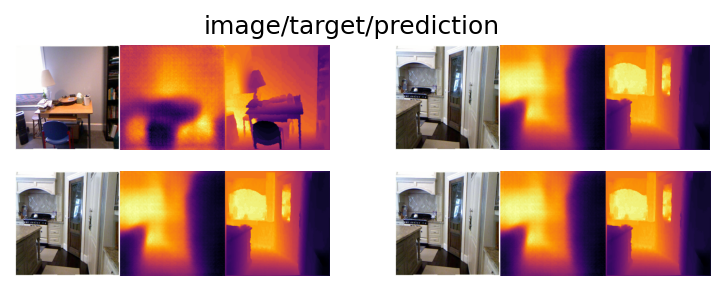

loss: 0.025: 100%|██████████| 72/72 [00:22<00:00,  3.22it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train  mse_val
23   0.040491  0.030351   0.922971  0.921187  0.004036  0.00336




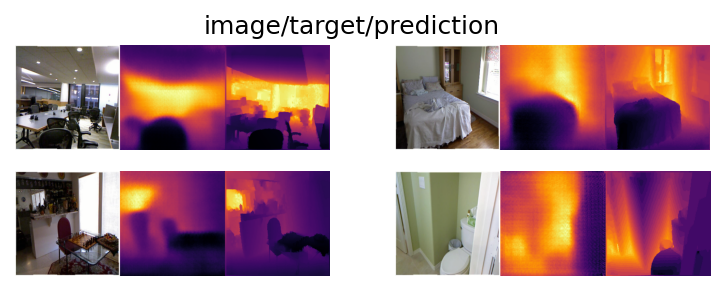

loss: 0.024: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
24   0.039523  0.028776   0.924983  0.921709  0.003817  0.002248




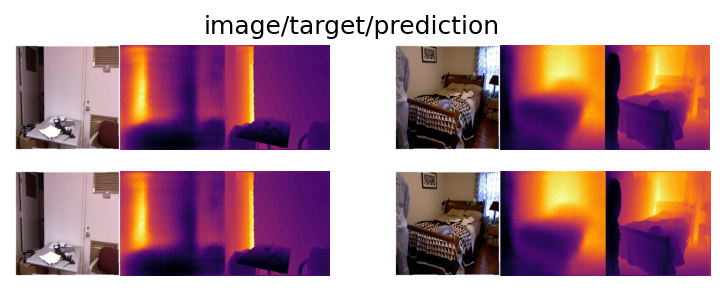

loss: 0.031: 100%|██████████| 72/72 [00:22<00:00,  3.24it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
25   0.038109  0.034599   0.926439  0.919396  0.003602  0.003185




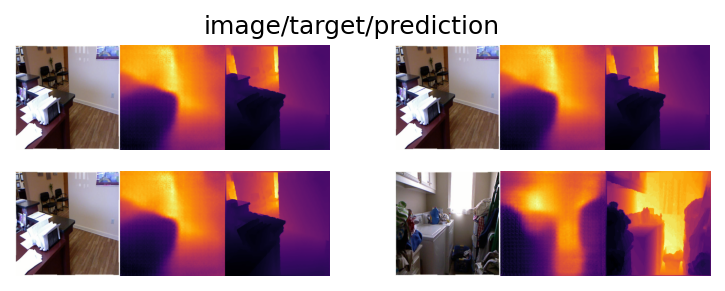

loss: 0.024: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




   loss_train  loss_val ssim_train ssim_val mse_train   mse_val
26   0.037508  0.028386   0.927295   0.9235  0.003505  0.002176




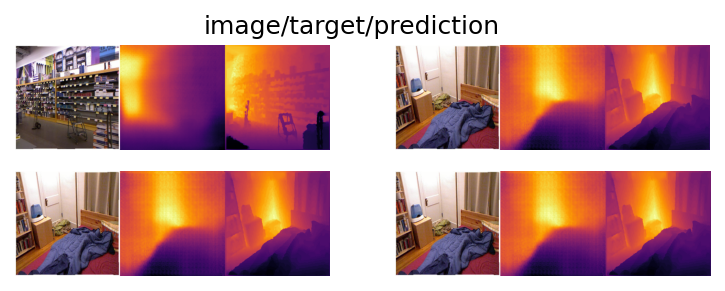

loss: 0.024: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




   loss_train  loss_val ssim_train ssim_val mse_train   mse_val
27   0.036176  0.027245     0.9289   0.9248   0.00329  0.002031




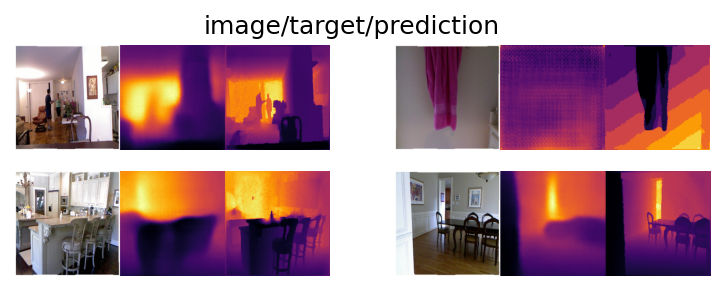

loss: 0.022: 100%|██████████| 72/72 [00:22<00:00,  3.27it/s]




   loss_train loss_val ssim_train  ssim_val mse_train   mse_val
28   0.035084  0.02633   0.930303  0.925693  0.003115  0.001974




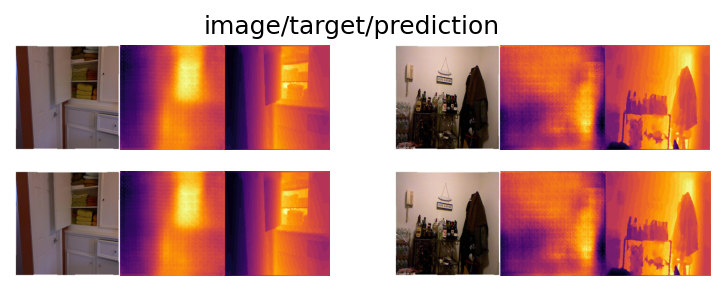

loss: 0.022: 100%|██████████| 72/72 [00:22<00:00,  3.26it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
29   0.034388  0.026302   0.930919  0.925691  0.003024  0.001957




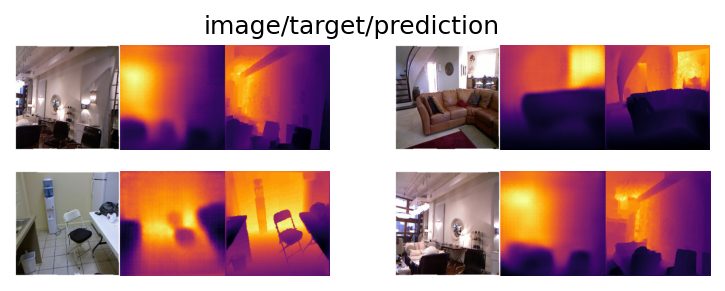

loss: 0.023: 100%|██████████| 72/72 [00:22<00:00,  3.24it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
30   0.033493  0.026612   0.932142  0.925672  0.002886  0.001955




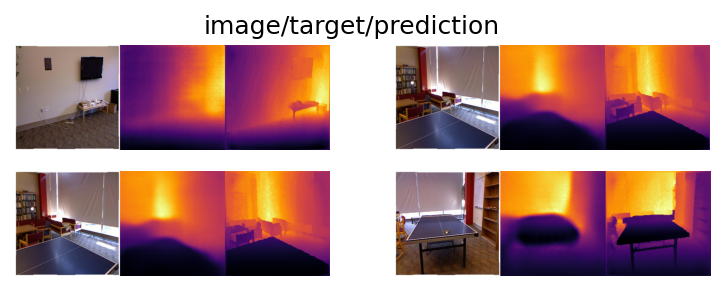

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.25it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
31   0.032556  0.025326   0.932844  0.927066  0.002751  0.001859




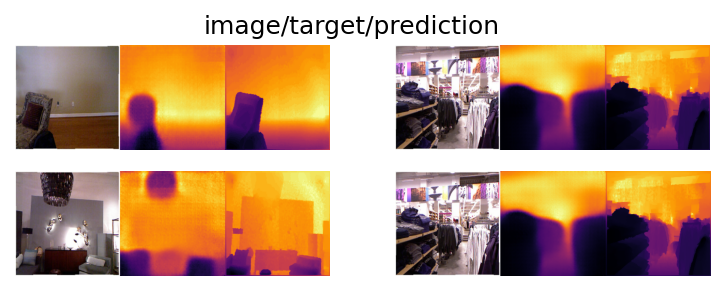

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.22it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
32   0.032125  0.025242   0.933427  0.927278  0.002716  0.001822




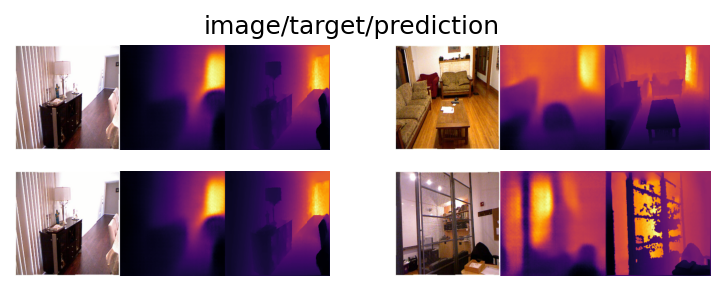

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.27it/s]




   loss_train loss_val ssim_train  ssim_val mse_train   mse_val
33   0.031427  0.02505   0.934263  0.927607  0.002615  0.001791




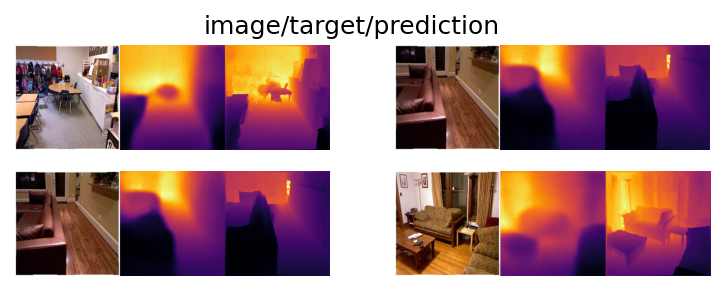

loss: 0.020: 100%|██████████| 72/72 [00:22<00:00,  3.27it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
34   0.030969  0.024332   0.934634  0.928202  0.002567  0.001739




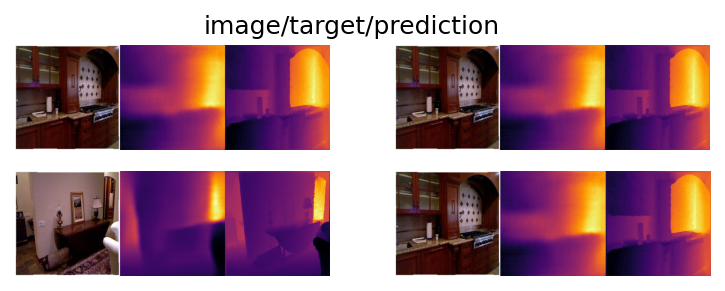

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.24it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
35   0.030604  0.024825   0.934991  0.928037  0.002512  0.001775




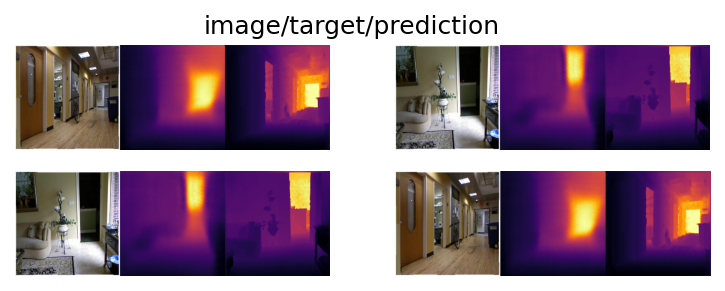

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.22it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
36    0.03012  0.024814   0.935366  0.928181  0.002447  0.001778




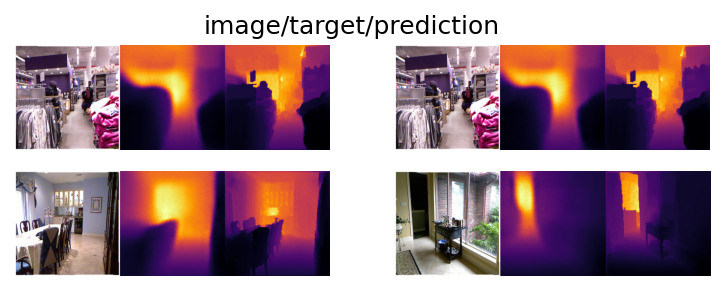

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.24it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
37   0.030016  0.024275   0.935553  0.928143  0.002447  0.001735




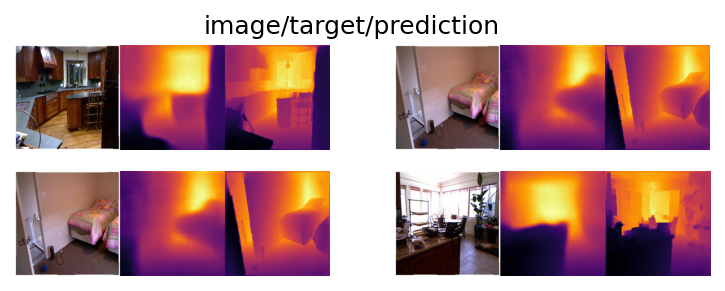

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.22it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
38   0.029844  0.024755   0.935846  0.928146  0.002409  0.001771




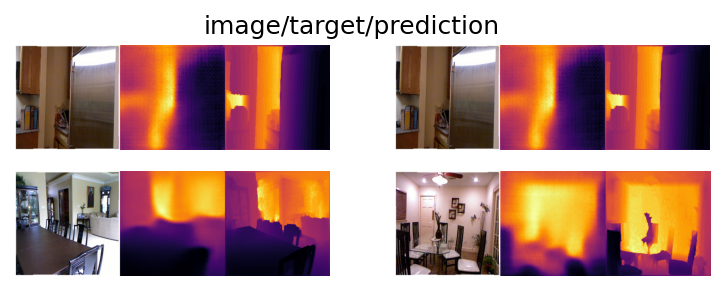

loss: 0.021: 100%|██████████| 72/72 [00:22<00:00,  3.22it/s]




   loss_train  loss_val ssim_train  ssim_val mse_train   mse_val
39    0.02978  0.024817   0.935647  0.927951  0.002401  0.001778




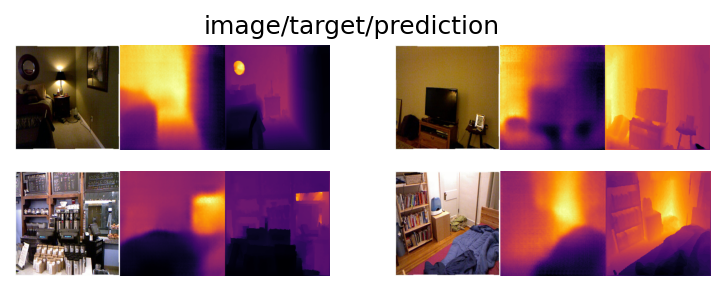

100%|██████████| 40/40 [6:11:08<00:00, 556.70s/it]


In [28]:
best_ssim = -1e9
best_epoch = -1

print('training decoder only')

for epoch in tqdm(range(epochs)):
    
    model.train()
    

    running_loss = 0.
    train_prog = tqdm(train_dl,total=len(train_dl))
    
    for img, mask in train_prog:
        
        with autocast():
            img, mask = img.to(device), mask.to(device)
            preds = model(img)

            loss = loss_fn(preds,mask)
            scaler.scale(loss).backward()
            scaler.unscale_(optim)
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0, norm_type=2)
            scaler.step(optim)
            scaler.update()
            sched.step()
            optim.zero_grad()

            running_loss += loss.item()

            train_prog.set_description(f'loss: {loss.item():.3f}')
            train_metrics(preds,mask)
        
        del img, mask, preds, loss

    m = train_metrics.compute()
    _ssim,_mse = m['StructuralSimilarityIndexMeasure'].cpu().item(), m['MeanSquaredError'].cpu().item()
    logs.loc[epoch,['loss_train','ssim_train','mse_train']] = (running_loss/len(train_dl),_ssim,_mse)
    train_metrics.reset()
    model.eval()
    
    with torch.no_grad():
        
        running_loss = 0.
        
        val_prog = tqdm(val_dl,total=len(val_dl))
        for img, mask in val_prog:

            with autocast():
                img, mask = img.to(device), mask.to(device)
                preds = model(img)
                loss = loss_fn(preds,mask)
                running_loss += loss.item()
                val_prog.set_description(f'loss: {loss.item():.3f}')
                
                val_metrics(preds, mask)
                
            del img, mask, preds, loss
            
        m = val_metrics.compute()
        _ssim,_mse = m['StructuralSimilarityIndexMeasure'].cpu().item(), m['MeanSquaredError'].cpu().item()
        logs.loc[epoch,['loss_val','ssim_val','mse_val']] = (running_loss/len(val_dl),_ssim,_mse)
        val_metrics.reset()
    
    if _ssim > best_ssim:
        best_ssim = _ssim
        best_epoch = epoch
        sd = model.state_dict()
        torch.save(sd,'nyu-v2-depth-resnet.pt')
        
    print(f"\n\n{logs.tail(1)}\n\n")
    
    with torch.no_grad():
        with autocast():
            img, mask = next(iter(test_dl))
            img, mask = img.to(device), mask.to(device)
            preds = model(img)
            plot_vals(
                img.cpu(),
                preds.cpu(),
                mask.cpu()
            )
        
    gc.collect()
    torch.cuda.empty_cache()

# Predictions
<div style="width:100%;height:0;border-bottom: 3px solid #F7D735;margin-bottom: 1rem;"></div>

In [19]:
best_epoch

38

In [20]:
best_sd = torch.load('nyu-v2-depth-resnet.pt')
model.load_state_dict(best_sd)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

100%|██████████| 127/127 [00:02<00:00, 44.93it/s]


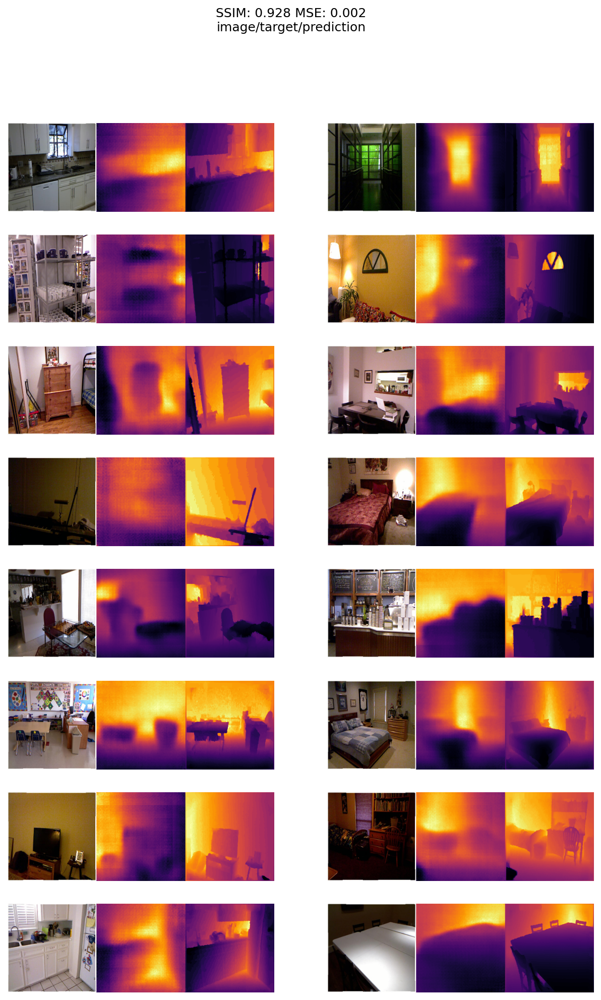

In [21]:
all_imgs, all_preds, all_targets = [], [], []
with torch.no_grad():
    with autocast():
        for img, mask in tqdm(test_dl,total=len(test_dl)):
            img, mask = img.to(device), mask.to(device)
            preds = model(img)
            all_imgs.append(img)
            all_preds.append(preds)
            all_targets.append(mask)

test_metrics = metrics.clone()
test_metrics(
    torch.vstack(all_preds),
    torch.vstack(all_targets)
)
m = test_metrics.compute()
title = f"SSIM: {m['StructuralSimilarityIndexMeasure'].cpu().item():.3f} MSE: {m['MeanSquaredError'].cpu().item():.3f}"
plot_vals(
    torch.vstack(all_imgs).cpu(),
    torch.vstack(all_preds).cpu(),
    torch.vstack(all_targets).cpu(),
    n=16,
    figsize=(10,15),
    title=title
)

# Results
<div style="width:100%;height:0;border-bottom: 3px solid #8DFA3F;margin-bottom: 1rem;"></div>

In [29]:
logs

,loss_train,loss_val,ssim_train,ssim_val,mse_train,mse_val
0,0.394418,0.119254,0.431908,0.388884,0.391218,0.037009
1,0.0793,0.076924,0.721112,0.693649,0.012891,0.016682
2,0.068921,0.052447,0.796017,0.838077,0.010126,0.006497
3,0.066518,0.05771,0.832082,0.844852,0.010063,0.008108
4,0.064096,0.064867,0.855968,0.825103,0.00935,0.015936
5,0.063785,0.07529,0.870003,0.856492,0.009458,0.022412
6,0.06243,0.062429,0.880398,0.89094,0.009183,0.019649
7,0.064263,0.044874,0.875891,0.894926,0.009442,0.004581
8,0.060379,0.046835,0.888639,0.897412,0.008221,0.007554
9,0.059558,0.041811,0.89369,0.904314,0.00815,0.004147


In [33]:
logs.to_csv("Resnet_net_res.csv",index=False)

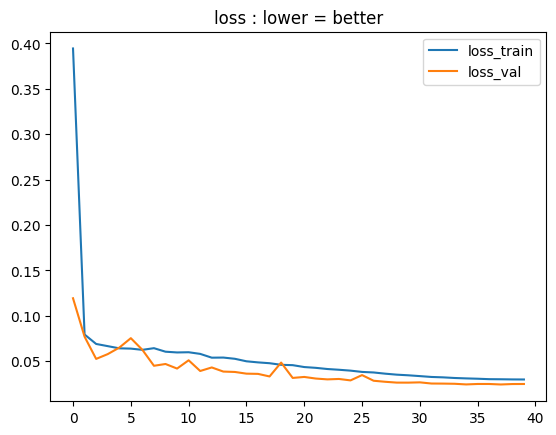

In [31]:
logs['loss_train'].plot()
logs['loss_val'].plot()
plt.title('loss : lower = better')
plt.legend()
plt.show()

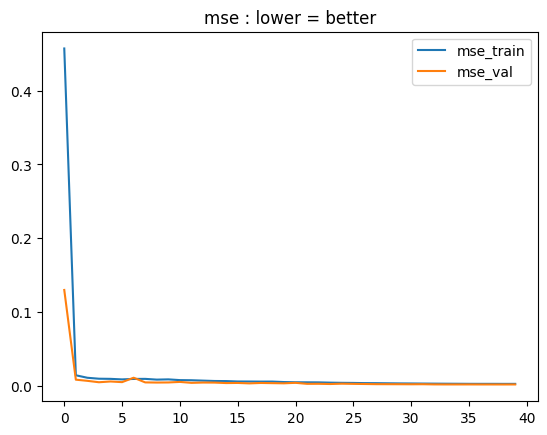

In [25]:
logs['mse_train'].plot()
logs['mse_val'].plot()
plt.title('mse : lower = better')
plt.legend()
plt.show()

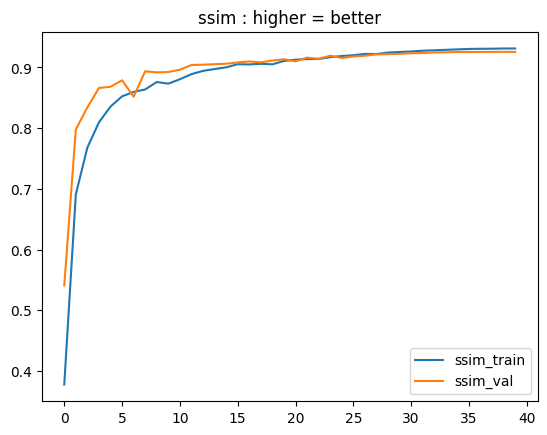

In [26]:
logs['ssim_train'].plot()
logs['ssim_val'].plot()
plt.title('ssim : higher = better')
plt.legend()
plt.show()